In [1]:
using Distributed
using Random
using Plots

In [2]:
addprocs(3); # add worker processes

In [3]:
@everywhere using RLInterface
@everywhere using ContinuumWorld
@everywhere using SoftActorCritic

In [4]:
using SoftActorCritic: ReplayBuffer, store!, sample_batch, update, test_agent, MLPActorCritic

In [5]:
@everywhere struct Master2Worker
    ac #policy
    n_steps::Int
    random_policy::Bool
end

In [6]:
@everywhere struct Worker2Master
    transition_tuples::Vector{NamedTuple}
end

In [7]:
jobs = RemoteChannel(()->Channel{Master2Worker}(32));
results = RemoteChannel(()->Channel{Worker2Master}(32));

In [8]:
# worker-side code
@everywhere function simulation_task(jobs, results, env_fn, max_ep_len) # define work function everywhere
    env = env_fn()
    transition_tuples = []
    while true
        job = take!(jobs)
        ac, n_steps, random_policy = job.ac, job.n_steps, job.random_policy
        
        empty!(transition_tuples)
        o, ep_ret, ep_len = reset!(env), 0, 0
        for t = 1:n_steps
            if random_policy
                a = sample_action(env)
            else
                a = ac(o)
            end
            
            #step the env
            o2, r, d, _ = step!(env, a)
            ep_ret += r
            ep_len += 1
            
            # Ignore done signal if comes from hitting time horizon
            d = (ep_len == max_ep_len) ? false : d
            
            push!(transition_tuples, (o=o,a=a,r=r,o2=o2,d=d))
            
            #very important and easy to miss!
            o = o2
            
            #End of trajectory handling
            if d || (ep_len == max_ep_len)
                #logger.store(EpRet=ep_ret, EpLen=ep_len)
                o, ep_ret, ep_len = reset!(env), 0, 0
            end
        end
        result = Worker2Master(transition_tuples)
        put!(results, result)
    end
end

In [9]:
# master-side code
function distributed_solve(sac::SAC)
    test_env = sac.env_fn()
    obs_dim, act_dim, gamma = sac.obs_dim, sac.act_dim, sac.gamma
    replay_buffer = ReplayBuffer(obs_dim, act_dim, sac.max_buffer_size)
    ac = MLPActorCritic(obs_dim, act_dim, sac.act_mins, sac.act_maxs, sac.hidden_sizes, sac.activation)
    ac_targ = deepcopy(ac)
    q_optimizer, pi_optimizer, alpha_optimizer = sac.q_optimizer, sac.pi_optimizer, sac.alpha_optimizer
    batch_size, epochs, steps_per_epoch = sac.batch_size, sac.epochs, sac.steps_per_epoch
    start_steps, max_ep_len = sac.start_steps, sac.max_ep_len
    update_after, update_every = sac.update_after, sac.update_every
    polyak, target_entropy, num_test_episodes = sac.polyak, sac.target_entropy, sac.num_test_episodes
    total_steps = steps_per_epoch * epochs
    println("total_steps=$(total_steps)")
    
    steps_per_worker = Int(update_every // nworkers()) #enforce values that are evenly divisible only
    Int(steps_per_epoch // update_every)  #should also be a perfect multiple
    
    for p in workers()
        remote_do(simulation_task, p, jobs, results, sac.env_fn, max_ep_len)
    end
    
    scores = []
    alpha = [1.0]
    # main update loop
    for t = 0:update_every:total_steps
        # start the next jobs
        random_policy = (t < start_steps) ? true : false
        for i = 1:nworkers()
            job = Master2Worker(ac, steps_per_worker, random_policy)
            put!(jobs, job)
        end
        #Update handling
        if t >= update_after
            println("updating (t=$t)")
            flush(stdout)
            for j = 1:update_every
                batch = sample_batch(replay_buffer, batch_size)
                update(ac, ac_targ, batch, q_optimizer, pi_optimizer, polyak, gamma, alpha_optimizer, alpha, target_entropy)
            end
        end
        # End of epoch handling
        if t % steps_per_epoch == 0
            epoch = t // steps_per_epoch + 1
        
            #save model
            #@show mean(mean.(Flux.params([ac.q1.q,ac.q2.q])))
            #@show mean(mean.(Flux.params([ac.pi.net,ac.pi.mu_layer,ac.pi.log_std_layer])))
        
            #test_agent()
            score = test_agent(ac, test_env, max_ep_len, num_test_episodes)
            @show score
            @show alpha[]
            push!(scores, score)
            # Log info about epoch
        end
        for i = 1:nworkers()
            result = take!(results) #will block here
            for tup in result.transition_tuples
                store!(replay_buffer, tup...)
            end
        end
    end
    info = Dict{String,Any}()
    info["scores"] = scores
    info["replay_buffer"] = replay_buffer
    
    ac, info
end

distributed_solve (generic function with 1 method)

In [10]:
Random.seed!(2001)
sac = SAC(; 
    env_fn=()->MDPEnvironment(CWorld(; stdev=(0.1,0.1))), 
    obs_dim=2, 
    act_dim=2, 
    act_mins=[-1.0, -1.0],
    act_maxs=[1.0, 1.0],
    epochs=200,
    steps_per_epoch=240,
    update_every=60
)

SAC(var"#5#6"(), 2, 2, [-1.0, -1.0], [1.0, 1.0], 0.95, 100000, [100, 100, 100], NNlib.swish, Flux.Optimise.ADAM(0.001, (0.9, 0.999), IdDict{Any,Any}()), Flux.Optimise.ADAM(0.001, (0.9, 0.999), IdDict{Any,Any}()), Flux.Optimise.ADAM(0.001, (0.9, 0.999), IdDict{Any,Any}()), 64, 200, 240, 1000, 50, 300, 60, 0.995, -2.0, 200, Random._GLOBAL_RNG())

In [11]:
ac, info = distributed_solve(sac::SAC)

total_steps=48000
score = -0.605
alpha[] = 1.0
score = -0.64
alpha[] = 1.0
updating (t=300)
updating (t=360)
updating (t=420)
updating (t=480)
score = -0.425
alpha[] = 0.759513462552538
updating (t=540)
updating (t=600)
updating (t=660)
updating (t=720)
score = -0.475
alpha[] = 0.5189563500397839
updating (t=780)
updating (t=840)
updating (t=900)
updating (t=960)
score = 0.235
alpha[] = 0.2786226574082642
updating (t=1020)
updating (t=1080)
updating (t=1140)
updating (t=1200)
score = 0.155
alpha[] = 0.048056777458259904
updating (t=1260)
updating (t=1320)
updating (t=1380)
updating (t=1440)
score = 0.605
alpha[] = 0.031420161181094544
updating (t=1500)
updating (t=1560)
updating (t=1620)
updating (t=1680)
score = 0.21
alpha[] = 0.011395398214997141
updating (t=1740)
updating (t=1800)
updating (t=1860)
updating (t=1920)
score = 1.02
alpha[] = 0.013107872556000318
updating (t=1980)
updating (t=2040)
updating (t=2100)
updating (t=2160)
score = 0.13
alpha[] = 0.01170576785789717
updating (

(MLPActorCritic(SoftActorCritic.SquashedGaussianMLPActor(Chain(Dense(2, 100, swish), Dense(100, 100, swish), Dense(100, 100, swish)), Dense(100, 2), Dense(100, 2), [-1.0, -1.0], [1.0, 1.0], Random._GLOBAL_RNG()), SoftActorCritic.MLPQFunction(Chain(Dense(4, 100, swish), Dense(100, 100, swish), Dense(100, 100, swish), Dense(100, 1))), SoftActorCritic.MLPQFunction(Chain(Dense(4, 100, swish), Dense(100, 100, swish), Dense(100, 100, swish), Dense(100, 1)))), Dict{String,Any}("scores" => Any[-0.605, -0.64, -0.425, -0.475, 0.235, 0.155, 0.605, 0.21, 1.02, 0.13  …  9.82, 9.655, 9.865, 9.675, 9.67, 9.825, 9.48, 9.93, 9.285, 9.655],"replay_buffer" => ReplayBuffer(Float32[1.645658 3.618284 … 0.0 0.0; 1.7732885 9.732164 … 0.0 0.0], Float32[0.27888012 0.58581156 … 0.0 0.0; 73.251564 194.14415 … 0.0 0.0], Float32[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Float32[-1.0 -1.0 … 0.0 0.0; -1.0 -1.0 … 0.0 0.0], Float32[1.0, 1.0, 1.0, 1.0, 1.0, 1

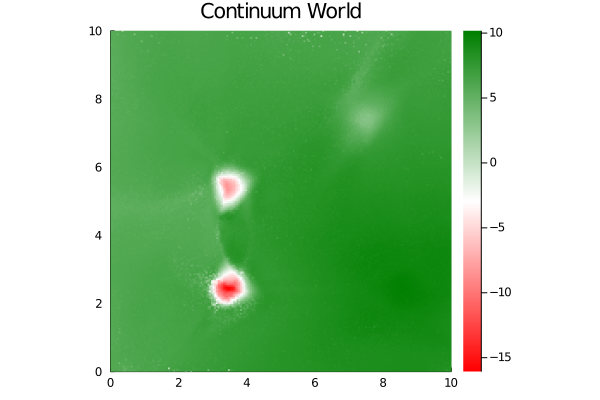

In [12]:
env = sac.env_fn()
plot(CWorldVis(env.problem, f=s->min(ac.q1(s,ac(s))[],ac.q2(s,ac(s))[])))

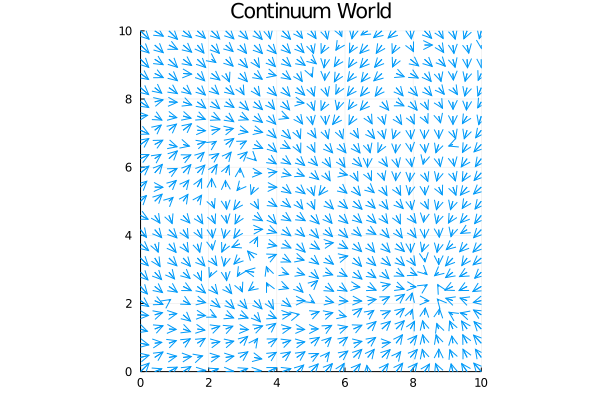

In [13]:
plot(CWorldVis(env.problem, fq=s->0.25.*ac(s)))

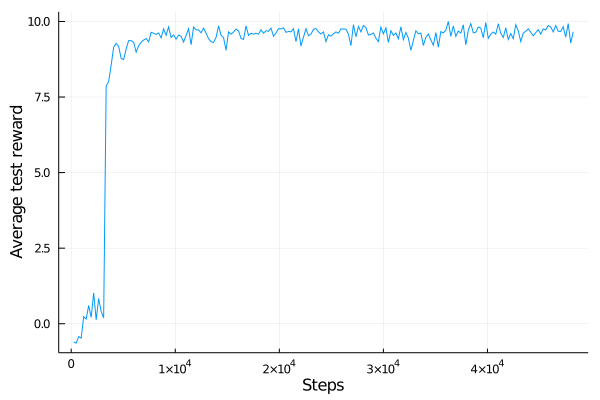

In [14]:
scores = info["scores"]
plot([i*sac.steps_per_epoch for i=1:length(scores)], scores, ylabel="Average test reward", xlabel="Steps", legend=false)

In [15]:
replay_buffer = info["replay_buffer"]
p = scatter(replay_buffer.obs_buf[1,1:replay_buffer.size], replay_buffer.obs_buf[2,1:replay_buffer.size], markersize=1, xlim=env.problem.xlim, ylim=env.problem.ylim,legend=false, title="Replay Buffer States")